# PROJETO DE MINERAÇÃO DE DADOS.

## A base de dados consiste na relação de algumas características fisiológicas apresentadas por cavalos, que irão indicar a propensão de que os animais venham a óbito ou não. 

### As imagens abaixo explicam as siglas de cada um dos atributos da base de dados para melhor compreenção do estudo como um todo.

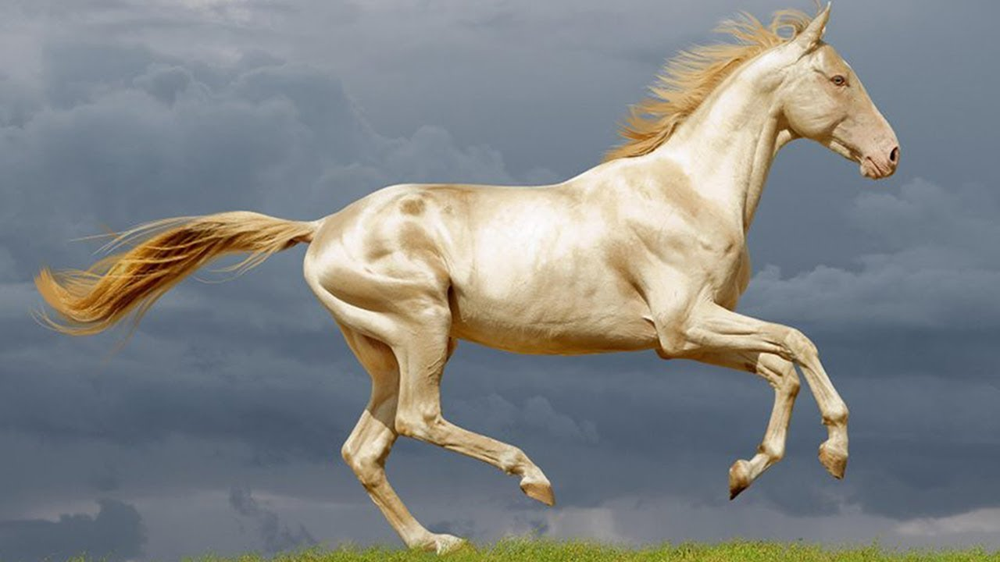<img src = 'cavalo_dourado.jpg'> 

# Carregando e Análises Exploratória Inicial.

In [1]:
"""Importando as bibliotecas iniciais para execução de uma análise exploratória dos dados"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
"""Visualizando o dataset"""

df = pd.read_csv('horse.csv')
df.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,nasogastric_reflux_ph,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,no,adult,530101,38.5,66.0,28.0,cool,reduced,NaN,more_3_sec,extreme_pain,absent,severe,NaN,NaN,NaN,decreased,distend_large,45.0,8.4,NaN,NaN,died,no,11300,0,0,no
1,yes,adult,534817,39.2,88.0,20.0,NaN,NaN,pale_cyanotic,less_3_sec,mild_pain,absent,slight,NaN,NaN,NaN,absent,other,50.0,85.0,cloudy,2.0,euthanized,no,2208,0,0,no
2,no,adult,530334,38.3,40.0,24.0,normal,normal,pale_pink,less_3_sec,mild_pain,hypomotile,none,NaN,NaN,NaN,normal,normal,33.0,6.7,NaN,NaN,lived,no,0,0,0,yes
3,yes,young,5290409,39.1,164.0,84.0,cold,normal,dark_cyanotic,more_3_sec,depressed,absent,severe,none,less_1_liter,5.0,decreased,NaN,48.0,7.2,serosanguious,5.3,died,yes,2208,0,0,yes
4,no,adult,530255,37.3,104.0,35.0,NaN,NaN,dark_cyanotic,more_3_sec,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,NaN,NaN,died,no,4300,0,0,no


In [3]:
df.shape

(299, 28)

In [4]:
df.columns

Index(['surgery', 'age', 'hospital_number', 'rectal_temp', 'pulse',
       'respiratory_rate', 'temp_of_extremities', 'peripheral_pulse',
       'mucous_membrane', 'capillary_refill_time', 'pain', 'peristalsis',
       'abdominal_distention', 'nasogastric_tube', 'nasogastric_reflux',
       'nasogastric_reflux_ph', 'rectal_exam_feces', 'abdomen',
       'packed_cell_volume', 'total_protein', 'abdomo_appearance',
       'abdomo_protein', 'outcome', 'surgical_lesion', 'lesion_1', 'lesion_2',
       'lesion_3', 'cp_data'],
      dtype='object')

In [5]:
import sys
!{sys.executable} -m pip install -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension

import pandas as pd
from pandas_profiling import ProfileReport

     |████████████████████████████████| 256kB 7.8MB/s 
     |████████████████████████████████| 81kB 8.0MB/s 
     |████████████████████████████████| 3.1MB 13.2MB/s 
     |████████████████████████████████| 61kB 7.3MB/s 
     |████████████████████████████████| 112kB 53.4MB/s 
     |████████████████████████████████| 10.1MB 45.8MB/s 
     |████████████████████████████████| 1.1MB 38.2MB/s 
     |████████████████████████████████| 645kB 30.2MB/s 
     |████████████████████████████████| 122kB 38.4MB/s 
     |████████████████████████████████| 296kB 39.8MB/s 
  Created wheel for phik: filename=phik-0.11.2-cp37-none-any.whl size=1107413 sha256=2d10a3dd1060f57b89206db5168200e258ac045d0bedacce69608c0dc286c607
  Stored in directory: /root/.cache/pip/wheels/c0/a3/b0/f27b1cfe32ea131a3715169132ff6d85653789e80e966c3bf6
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp37-none-any.whl size=27085 sha256=b2eb32a77abe622bc914b40f6413255e42e798c0e07da753a7f97da496f1a98b
  Stored in directory: /root/.cac

In [6]:
"""Gerando relatório geral ainda sem realizar nenhum tipo de tratamento direto na base de dados."""

profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/41 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
'''Salvando o Relatório criado em formato PDF'''

profile.to_file('Relatório Estatístico')

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:267: UserWarning: Extension  not supported. For now we assume .html was intended. To remove this warning, please use .html or .json.
  f"Extension {suffix} not supported. For now we assume .html was intended. "


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Pré processamento e tratamento dos dados.

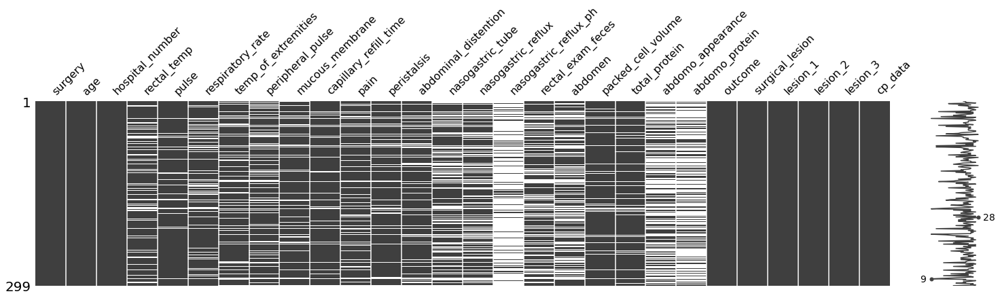

In [8]:
"""Código utilizando para verificar com maior precisão de detalhes, quais são os dados faltantes no dataset"""

import missingno as msno

msno.matrix(df, figsize=(25,5));

In [10]:
"""Após verificar a imagem acima, é possível determinar que os atributos: 
1) nasogastric_reflux_ph; 
2) abdomo_appearance;
3) abdomo_protein

Podem ser removidos do dataset, pois possuem mais de 50% de dados faltantes. E para essa tarefa o código abaixo
irá excluir esses atributos."""

"""Após codificação dos outros atributos, outras técnicas de tratamento de missing serão realizadas a fim adequar a base de dados 
para construção dos modelos preditivos."""

data = df.drop(['nasogastric_reflux_ph','abdomo_appearance','abdomo_protein'], axis = 1)

In [11]:
data.columns

Index(['surgery', 'age', 'hospital_number', 'rectal_temp', 'pulse',
       'respiratory_rate', 'temp_of_extremities', 'peripheral_pulse',
       'mucous_membrane', 'capillary_refill_time', 'pain', 'peristalsis',
       'abdominal_distention', 'nasogastric_tube', 'nasogastric_reflux',
       'rectal_exam_feces', 'abdomen', 'packed_cell_volume', 'total_protein',
       'outcome', 'surgical_lesion', 'lesion_1', 'lesion_2', 'lesion_3',
       'cp_data'],
      dtype='object')

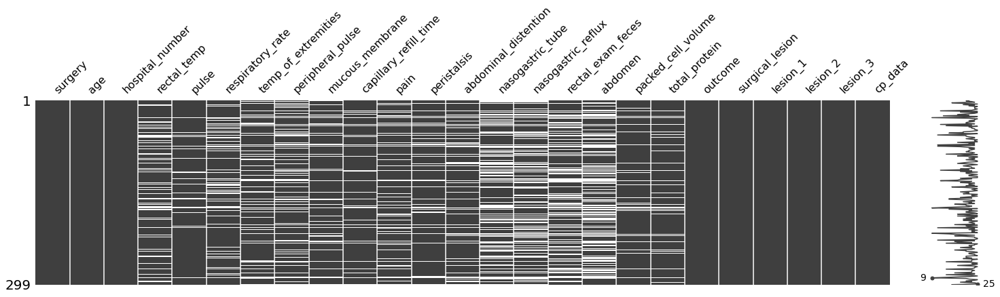

In [12]:
msno.matrix(data, figsize=(25,5));

In [13]:
"""Sequência de códigos usados para verificar quais são as colunas com dados categóricos e quais possuem dados numéricos."""

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   surgery                299 non-null    object 
 1   age                    299 non-null    object 
 2   hospital_number        299 non-null    int64  
 3   rectal_temp            239 non-null    float64
 4   pulse                  275 non-null    float64
 5   respiratory_rate       241 non-null    float64
 6   temp_of_extremities    243 non-null    object 
 7   peripheral_pulse       230 non-null    object 
 8   mucous_membrane        252 non-null    object 
 9   capillary_refill_time  267 non-null    object 
 10  pain                   244 non-null    object 
 11  peristalsis            255 non-null    object 
 12  abdominal_distention   243 non-null    object 
 13  nasogastric_tube       195 non-null    object 
 14  nasogastric_reflux     193 non-null    object 
 15  rectal

In [14]:
"""Código usado para criar uma cópia do dataframe original apenas com os dados categóricos do dataframe original."""

cat_data = data.select_dtypes(include=['object']).copy()
cat_data.head()

,surgery,age,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,rectal_exam_feces,abdomen,outcome,surgical_lesion,cp_data
0,no,adult,cool,reduced,NaN,more_3_sec,extreme_pain,absent,severe,NaN,NaN,decreased,distend_large,died,no,no
1,yes,adult,NaN,NaN,pale_cyanotic,less_3_sec,mild_pain,absent,slight,NaN,NaN,absent,other,euthanized,no,no
2,no,adult,normal,normal,pale_pink,less_3_sec,mild_pain,hypomotile,none,NaN,NaN,normal,normal,lived,no,yes
3,yes,young,cold,normal,dark_cyanotic,more_3_sec,depressed,absent,severe,none,less_1_liter,decreased,NaN,died,yes,yes
4,no,adult,NaN,NaN,dark_cyanotic,more_3_sec,NaN,NaN,NaN,NaN,NaN,NaN,NaN,died,no,no


# Codificação

## Codificando a coluna (surgery)

In [15]:
print(data['surgery'].value_counts())

yes    180
no     119
Name: surgery, dtype: int64


In [16]:
labels = data['surgery'].astype('category').cat.categories.tolist()
replace_map_comp = {'surgery': {k: v for k,v in zip(labels,list(range(1,len(labels)+1)))}}

print(replace_map_comp)

{'surgery': {'no': 1, 'yes': 2}}


In [17]:
data.replace(replace_map_comp, inplace=True)

data.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,1,adult,530101,38.5,66.0,28.0,cool,reduced,NaN,more_3_sec,extreme_pain,absent,severe,NaN,NaN,decreased,distend_large,45.0,8.4,died,no,11300,0,0,no
1,2,adult,534817,39.2,88.0,20.0,NaN,NaN,pale_cyanotic,less_3_sec,mild_pain,absent,slight,NaN,NaN,absent,other,50.0,85.0,euthanized,no,2208,0,0,no
2,1,adult,530334,38.3,40.0,24.0,normal,normal,pale_pink,less_3_sec,mild_pain,hypomotile,none,NaN,NaN,normal,normal,33.0,6.7,lived,no,0,0,0,yes
3,2,young,5290409,39.1,164.0,84.0,cold,normal,dark_cyanotic,more_3_sec,depressed,absent,severe,none,less_1_liter,decreased,NaN,48.0,7.2,died,yes,2208,0,0,yes
4,1,adult,530255,37.3,104.0,35.0,NaN,NaN,dark_cyanotic,more_3_sec,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,died,no,4300,0,0,no


## Codificando a coluna (age)

In [18]:
print(data['age'].value_counts())

adult    275
young     24
Name: age, dtype: int64


In [19]:
labels = data['age'].astype('category').cat.categories.tolist()
replace_map_comp = {'age': {k: v for k,v in zip(labels,list(range(1,len(labels)+1)))}}

print(replace_map_comp)

{'age': {'adult': 1, 'young': 2}}


In [20]:
data.replace(replace_map_comp, inplace=True)

data.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,1,1,530101,38.5,66.0,28.0,cool,reduced,NaN,more_3_sec,extreme_pain,absent,severe,NaN,NaN,decreased,distend_large,45.0,8.4,died,no,11300,0,0,no
1,2,1,534817,39.2,88.0,20.0,NaN,NaN,pale_cyanotic,less_3_sec,mild_pain,absent,slight,NaN,NaN,absent,other,50.0,85.0,euthanized,no,2208,0,0,no
2,1,1,530334,38.3,40.0,24.0,normal,normal,pale_pink,less_3_sec,mild_pain,hypomotile,none,NaN,NaN,normal,normal,33.0,6.7,lived,no,0,0,0,yes
3,2,2,5290409,39.1,164.0,84.0,cold,normal,dark_cyanotic,more_3_sec,depressed,absent,severe,none,less_1_liter,decreased,NaN,48.0,7.2,died,yes,2208,0,0,yes
4,1,1,530255,37.3,104.0,35.0,NaN,NaN,dark_cyanotic,more_3_sec,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,died,no,4300,0,0,no


## Codificando a coluna (temp_of_extremities)

In [21]:
print(data['temp_of_extremities'].value_counts())

cool      108
normal     78
warm       30
cold       27
Name: temp_of_extremities, dtype: int64


In [22]:
labels = data['temp_of_extremities'].astype('category').cat.categories.tolist()
replace_map_comp = {'temp_of_extremities': {k: v for k,v in zip(labels,list(range(1,len(labels)+1)))}}

print(replace_map_comp)

{'temp_of_extremities': {'cold': 1, 'cool': 2, 'normal': 3, 'warm': 4}}


In [23]:
data.replace(replace_map_comp, inplace=True)
data.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,1,1,530101,38.5,66.0,28.0,2.0,reduced,NaN,more_3_sec,extreme_pain,absent,severe,NaN,NaN,decreased,distend_large,45.0,8.4,died,no,11300,0,0,no
1,2,1,534817,39.2,88.0,20.0,NaN,NaN,pale_cyanotic,less_3_sec,mild_pain,absent,slight,NaN,NaN,absent,other,50.0,85.0,euthanized,no,2208,0,0,no
2,1,1,530334,38.3,40.0,24.0,3.0,normal,pale_pink,less_3_sec,mild_pain,hypomotile,none,NaN,NaN,normal,normal,33.0,6.7,lived,no,0,0,0,yes
3,2,2,5290409,39.1,164.0,84.0,1.0,normal,dark_cyanotic,more_3_sec,depressed,absent,severe,none,less_1_liter,decreased,NaN,48.0,7.2,died,yes,2208,0,0,yes
4,1,1,530255,37.3,104.0,35.0,NaN,NaN,dark_cyanotic,more_3_sec,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,died,no,4300,0,0,no


## Codificando a coluna (peripheral_pulse)

In [24]:
print(data['peripheral_pulse'].value_counts())

normal       114
reduced      103
absent         8
increased      5
Name: peripheral_pulse, dtype: int64


In [25]:
labels = data['peripheral_pulse'].astype('category').cat.categories.tolist()
replace_map_comp = {'peripheral_pulse': {k: v for k,v in zip(labels,list(range(1,len(labels)+1)))}}

print(replace_map_comp)

{'peripheral_pulse': {'absent': 1, 'increased': 2, 'normal': 3, 'reduced': 4}}


In [26]:
data.replace(replace_map_comp, inplace=True)
data.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,1,1,530101,38.5,66.0,28.0,2.0,4.0,NaN,more_3_sec,extreme_pain,absent,severe,NaN,NaN,decreased,distend_large,45.0,8.4,died,no,11300,0,0,no
1,2,1,534817,39.2,88.0,20.0,NaN,NaN,pale_cyanotic,less_3_sec,mild_pain,absent,slight,NaN,NaN,absent,other,50.0,85.0,euthanized,no,2208,0,0,no
2,1,1,530334,38.3,40.0,24.0,3.0,3.0,pale_pink,less_3_sec,mild_pain,hypomotile,none,NaN,NaN,normal,normal,33.0,6.7,lived,no,0,0,0,yes
3,2,2,5290409,39.1,164.0,84.0,1.0,3.0,dark_cyanotic,more_3_sec,depressed,absent,severe,none,less_1_liter,decreased,NaN,48.0,7.2,died,yes,2208,0,0,yes
4,1,1,530255,37.3,104.0,35.0,NaN,NaN,dark_cyanotic,more_3_sec,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,died,no,4300,0,0,no


## Codificando a coluna (mucous_membrane)

In [27]:
print(data['mucous_membrane'].value_counts())

normal_pink      79
pale_pink        57
pale_cyanotic    41
bright_pink      30
bright_red       25
dark_cyanotic    20
Name: mucous_membrane, dtype: int64


In [28]:
labels = data['mucous_membrane'].astype('category').cat.categories.tolist()
replace_map_comp = {'mucous_membrane': {k: v for k,v in zip(labels,list(range(1,len(labels)+1)))}}

print(replace_map_comp)

{'mucous_membrane': {'bright_pink': 1, 'bright_red': 2, 'dark_cyanotic': 3, 'normal_pink': 4, 'pale_cyanotic': 5, 'pale_pink': 6}}


In [29]:
data.replace(replace_map_comp, inplace=True)
data.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,1,1,530101,38.5,66.0,28.0,2.0,4.0,NaN,more_3_sec,extreme_pain,absent,severe,NaN,NaN,decreased,distend_large,45.0,8.4,died,no,11300,0,0,no
1,2,1,534817,39.2,88.0,20.0,NaN,NaN,5.0,less_3_sec,mild_pain,absent,slight,NaN,NaN,absent,other,50.0,85.0,euthanized,no,2208,0,0,no
2,1,1,530334,38.3,40.0,24.0,3.0,3.0,6.0,less_3_sec,mild_pain,hypomotile,none,NaN,NaN,normal,normal,33.0,6.7,lived,no,0,0,0,yes
3,2,2,5290409,39.1,164.0,84.0,1.0,3.0,3.0,more_3_sec,depressed,absent,severe,none,less_1_liter,decreased,NaN,48.0,7.2,died,yes,2208,0,0,yes
4,1,1,530255,37.3,104.0,35.0,NaN,NaN,3.0,more_3_sec,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,died,no,4300,0,0,no


## Codificando a coluna (capillary_refill_time)

In [30]:
print(data['capillary_refill_time'].value_counts())

less_3_sec    187
more_3_sec     78
3               2
Name: capillary_refill_time, dtype: int64


In [31]:
labels = data['capillary_refill_time'].astype('category').cat.categories.tolist()
replace_map_comp = {'capillary_refill_time': {k: v for k,v in zip(labels,list(range(1,len(labels)+1)))}}

data.replace(replace_map_comp, inplace=True)

## Codificando a coluna (pain)

In [32]:
print(data['pain'].value_counts())

mild_pain       67
depressed       59
extreme_pain    42
alert           38
severe_pain     38
Name: pain, dtype: int64


In [33]:
labels = data['pain'].astype('category').cat.categories.tolist()
replace_map_comp = {'pain': {k: v for k,v in zip(labels,list(range(1,len(labels)+1)))}}

print(replace_map_comp)

{'pain': {'alert': 1, 'depressed': 2, 'extreme_pain': 3, 'mild_pain': 4, 'severe_pain': 5}}


In [34]:
data.replace(replace_map_comp, inplace=True)
data.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,1,1,530101,38.5,66.0,28.0,2.0,4.0,NaN,3.0,3.0,absent,severe,NaN,NaN,decreased,distend_large,45.0,8.4,died,no,11300,0,0,no
1,2,1,534817,39.2,88.0,20.0,NaN,NaN,5.0,2.0,4.0,absent,slight,NaN,NaN,absent,other,50.0,85.0,euthanized,no,2208,0,0,no
2,1,1,530334,38.3,40.0,24.0,3.0,3.0,6.0,2.0,4.0,hypomotile,none,NaN,NaN,normal,normal,33.0,6.7,lived,no,0,0,0,yes
3,2,2,5290409,39.1,164.0,84.0,1.0,3.0,3.0,3.0,2.0,absent,severe,none,less_1_liter,decreased,NaN,48.0,7.2,died,yes,2208,0,0,yes
4,1,1,530255,37.3,104.0,35.0,NaN,NaN,3.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,died,no,4300,0,0,no


## Codificando a coluna (peristalsis)

In [35]:
"""Como maneira de complementar o conhecimento, o código abaixo é usado para determinar a frequência de repetição
de um determinado valor em um atributo."""

print(data['peristalsis'].value_counts())

hypomotile     127
absent          73
hypermotile     39
normal          16
Name: peristalsis, dtype: int64


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


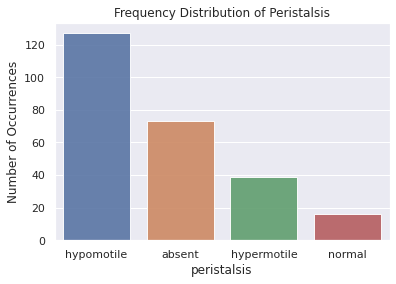

In [36]:
"""Representação da frequência através de gráficos"""

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

peristalsis_count = data['peristalsis'].value_counts()
sns.set(style="darkgrid")
sns.barplot(peristalsis_count.index, peristalsis_count.values, alpha=0.9)
plt.title('Frequency Distribution of Peristalsis')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('peristalsis', fontsize=12)
plt.show()

In [37]:
""" A partir do momento em que sabemos quais sao os dados categóricos, é possível codificar os mesmos e verificar
como os mesmos ficarão em um novo dataframe."""

labels = data['peristalsis'].astype('category').cat.categories.tolist()
replace_map_comp = {'peristalsis': {k: v for k,v in zip(labels,list(range(1,len(labels)+1)))}}

print(replace_map_comp)

{'peristalsis': {'absent': 1, 'hypermotile': 2, 'hypomotile': 3, 'normal': 4}}


In [38]:
data.replace(replace_map_comp, inplace=True)
data.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,1,1,530101,38.5,66.0,28.0,2.0,4.0,NaN,3.0,3.0,1.0,severe,NaN,NaN,decreased,distend_large,45.0,8.4,died,no,11300,0,0,no
1,2,1,534817,39.2,88.0,20.0,NaN,NaN,5.0,2.0,4.0,1.0,slight,NaN,NaN,absent,other,50.0,85.0,euthanized,no,2208,0,0,no
2,1,1,530334,38.3,40.0,24.0,3.0,3.0,6.0,2.0,4.0,3.0,none,NaN,NaN,normal,normal,33.0,6.7,lived,no,0,0,0,yes
3,2,2,5290409,39.1,164.0,84.0,1.0,3.0,3.0,3.0,2.0,1.0,severe,none,less_1_liter,decreased,NaN,48.0,7.2,died,yes,2208,0,0,yes
4,1,1,530255,37.3,104.0,35.0,NaN,NaN,3.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,died,no,4300,0,0,no


## Codificando a coluna (abdominal_distention)

In [39]:
print(data['abdominal_distention'].value_counts())

none        75
moderate    65
slight      65
severe      38
Name: abdominal_distention, dtype: int64


In [40]:
label = data['abdominal_distention'].astype('category').cat.categories.tolist()
rep = {'abdominal_distention': {k: v for k,v in zip(label,list(range(1,len(label)+1)))}}

print(rep)

{'abdominal_distention': {'moderate': 1, 'none': 2, 'severe': 3, 'slight': 4}}


In [41]:
data.replace(rep, inplace=True)
data.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,1,1,530101,38.5,66.0,28.0,2.0,4.0,NaN,3.0,3.0,1.0,3.0,NaN,NaN,decreased,distend_large,45.0,8.4,died,no,11300,0,0,no
1,2,1,534817,39.2,88.0,20.0,NaN,NaN,5.0,2.0,4.0,1.0,4.0,NaN,NaN,absent,other,50.0,85.0,euthanized,no,2208,0,0,no
2,1,1,530334,38.3,40.0,24.0,3.0,3.0,6.0,2.0,4.0,3.0,2.0,NaN,NaN,normal,normal,33.0,6.7,lived,no,0,0,0,yes
3,2,2,5290409,39.1,164.0,84.0,1.0,3.0,3.0,3.0,2.0,1.0,3.0,none,less_1_liter,decreased,NaN,48.0,7.2,died,yes,2208,0,0,yes
4,1,1,530255,37.3,104.0,35.0,NaN,NaN,3.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,died,no,4300,0,0,no


## Codificando a coluna (nasogastric_tube)

In [42]:
data['nasogastric_tube'].value_counts()

slight         101
none            71
significant     23
Name: nasogastric_tube, dtype: int64

In [43]:
label = data['nasogastric_tube'].astype('category').cat.categories.tolist()
rep = {'nasogastric_tube': {k: v for k,v in zip(label,list(range(1,len(label)+1)))}}

print(rep)

{'nasogastric_tube': {'none': 1, 'significant': 2, 'slight': 3}}


In [44]:
data.replace(rep, inplace=True)
data.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,1,1,530101,38.5,66.0,28.0,2.0,4.0,NaN,3.0,3.0,1.0,3.0,NaN,NaN,decreased,distend_large,45.0,8.4,died,no,11300,0,0,no
1,2,1,534817,39.2,88.0,20.0,NaN,NaN,5.0,2.0,4.0,1.0,4.0,NaN,NaN,absent,other,50.0,85.0,euthanized,no,2208,0,0,no
2,1,1,530334,38.3,40.0,24.0,3.0,3.0,6.0,2.0,4.0,3.0,2.0,NaN,NaN,normal,normal,33.0,6.7,lived,no,0,0,0,yes
3,2,2,5290409,39.1,164.0,84.0,1.0,3.0,3.0,3.0,2.0,1.0,3.0,1.0,less_1_liter,decreased,NaN,48.0,7.2,died,yes,2208,0,0,yes
4,1,1,530255,37.3,104.0,35.0,NaN,NaN,3.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,died,no,4300,0,0,no


## Codificando a coluna (nasogastric_reflux)

In [45]:
data['nasogastric_reflux'].value_counts()

none            119
more_1_liter     39
less_1_liter     35
Name: nasogastric_reflux, dtype: int64

In [46]:
label = data['nasogastric_reflux'].astype('category').cat.categories.tolist()
rep = {'nasogastric_reflux': {k: v for k,v in zip(label,list(range(1,len(label)+1)))}}

data.replace(rep, inplace=True)

## Codificando a coluna (rectal_exam_feces)

In [47]:
data['rectal_exam_feces'].value_counts()

absent       79
normal       57
decreased    48
increased    13
Name: rectal_exam_feces, dtype: int64

In [48]:
label = data['rectal_exam_feces'].astype('category').cat.categories.tolist()
rep = {'rectal_exam_feces': {k: v for k, v in zip(label,list(range(1,len(label)+1)))}}

data.replace(rep, inplace=True)

## Codificando a coluna (abdomen)

In [49]:
data['abdomen'].value_counts()

distend_large    78
distend_small    43
normal           28
other            19
firm             13
Name: abdomen, dtype: int64

In [50]:
label = data['abdomen'].astype('category').cat.categories.tolist()
rep = {'abdomen': {k: v for k, v in zip(label,list(range(1,len(label)+1)))}}

data.replace(rep, inplace=True)

## Codificando a coluna (outcome)

In [51]:
data['outcome'].value_counts()

lived         178
died           77
euthanized     44
Name: outcome, dtype: int64

In [52]:
label = data['outcome'].astype('category').cat.categories.tolist()
rep = {'outcome': {k: v for k, v in zip(label,list(range(1,len(label)+1)))}}

data.replace(rep, inplace=True)

## Codificando a coluna (surgical_lesion)

In [53]:
data['surgical_lesion'].value_counts()

yes    190
no     109
Name: surgical_lesion, dtype: int64

In [54]:
label = data['surgical_lesion'].astype('category').cat.categories.tolist()

rep = {'surgical_lesion': {k: v for k, v in zip(label,list(range(1,len(label)+1)))}}

data.replace(rep, inplace=True)

## Codificando a coluna (cp_data)

In [55]:
data['cp_data'].value_counts()

no     200
yes     99
Name: cp_data, dtype: int64

In [56]:
label = data["cp_data"].astype('category').cat.categories.tolist()
rep = {'cp_data': {k: v for k, v in zip(label,list(range(1,len(label)+1)))}}

data.replace(rep, inplace=True)

## Verificando todos os atributos após codificação

In [57]:
"""Verificando como ficou a coluna após a codificação"""
data.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,1,1,530101,38.5,66.0,28.0,2.0,4.0,NaN,3.0,3.0,1.0,3.0,NaN,NaN,2.0,1.0,45.0,8.4,1,1,11300,0,0,1
1,2,1,534817,39.2,88.0,20.0,NaN,NaN,5.0,2.0,4.0,1.0,4.0,NaN,NaN,1.0,5.0,50.0,85.0,2,1,2208,0,0,1
2,1,1,530334,38.3,40.0,24.0,3.0,3.0,6.0,2.0,4.0,3.0,2.0,NaN,NaN,4.0,4.0,33.0,6.7,3,1,0,0,0,2
3,2,2,5290409,39.1,164.0,84.0,1.0,3.0,3.0,3.0,2.0,1.0,3.0,1.0,1.0,2.0,NaN,48.0,7.2,1,2,2208,0,0,2
4,1,1,530255,37.3,104.0,35.0,NaN,NaN,3.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,1,1,4300,0,0,1


In [58]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   surgery                299 non-null    int64  
 1   age                    299 non-null    int64  
 2   hospital_number        299 non-null    int64  
 3   rectal_temp            239 non-null    float64
 4   pulse                  275 non-null    float64
 5   respiratory_rate       241 non-null    float64
 6   temp_of_extremities    243 non-null    float64
 7   peripheral_pulse       230 non-null    float64
 8   mucous_membrane        252 non-null    float64
 9   capillary_refill_time  267 non-null    float64
 10  pain                   244 non-null    float64
 11  peristalsis            255 non-null    float64
 12  abdominal_distention   243 non-null    float64
 13  nasogastric_tube       195 non-null    float64
 14  nasogastric_reflux     193 non-null    float64
 15  rectal

# Tratamento dos dados Faltantes (Missing)

## Verificando dados faltantes após codificação e realizando os devidos tratamentos.

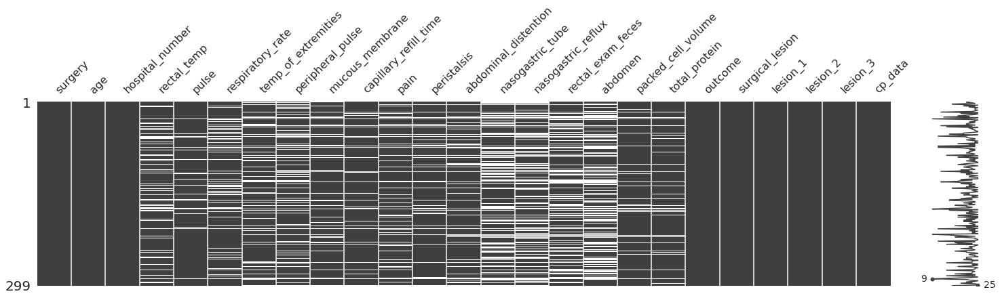

In [59]:
msno.matrix(data, figsize=(25,5));

In [60]:
''' Verificar missing por linha'''

percent_missing_rows = data.apply(lambda x: x.isnull().sum() * 100 / len(data), axis=1).sort_values(ascending=False)

dm = pd.DataFrame({'row_index': data.index, 'percent_missing': percent_missing_rows})
dm.head()

,row_index,percent_missing
287,0,5.351171
28,1,5.351171
174,2,5.351171
215,3,5.351171
226,4,4.682274


In [62]:
''' Imputação de valores através do SimpleImputer '''

from sklearn.impute import SimpleImputer

my_imputer = SimpleImputer()
data_NEW = pd.DataFrame(my_imputer.fit_transform(data))

In [63]:
''' Cria uma cópia do dataset para evitar mudanças após a codificação. '''
new_data = data.copy()

# criando novas colunas indicando o que será incluso no lugar faltante.
cols_with_missing = (col for col in new_data.columns 
                                 if new_data[col].isnull().any())
for col in cols_with_missing:
    new_data[col + '_was_missing'] = new_data[col].isnull()

# Inclusão de dados
my_imputer = SimpleImputer()
new_data = pd.DataFrame(my_imputer.fit_transform(new_data))
new_data.columns 

RangeIndex(start=0, stop=41, step=1)

In [64]:
data_NEW.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
0,1.0,1.0,530101.0,38.5,66.0,28.0,2.00000,4.000000,3.980159,3.0,3.000000,1.000000,3.000000,2.153846,2.435233,2.000000,1.000000,45.0,8.4,1.0,1.0,11300.0,0.0,0.0,1.0
1,2.0,1.0,534817.0,39.2,88.0,20.0,2.45679,3.356522,5.000000,2.0,4.000000,1.000000,4.000000,2.153846,2.435233,1.000000,5.000000,50.0,85.0,2.0,1.0,2208.0,0.0,0.0,1.0
2,1.0,1.0,530334.0,38.3,40.0,24.0,3.00000,3.000000,6.000000,2.0,4.000000,3.000000,2.000000,2.153846,2.435233,4.000000,4.000000,33.0,6.7,3.0,1.0,0.0,0.0,0.0,2.0
3,2.0,2.0,5290409.0,39.1,164.0,84.0,1.00000,3.000000,3.000000,3.0,2.000000,1.000000,3.000000,1.000000,1.000000,2.000000,2.265193,48.0,7.2,1.0,2.0,2208.0,0.0,0.0,2.0
4,1.0,1.0,530255.0,37.3,104.0,35.0,2.45679,3.356522,3.000000,3.0,3.032787,2.337255,2.423868,2.153846,2.435233,2.243655,2.265193,74.0,7.4,1.0,1.0,4300.0,0.0,0.0,1.0


In [65]:
# remover colunas com variância zero

from sklearn.feature_selection import VarianceThreshold

zero_var_filter = VarianceThreshold()
df = zero_var_filter.fit_transform(data_NEW)

In [66]:
# colunas com variância zero

(zero_var_filter.variances_ == 0).sum()

0

In [67]:
# novo shape

pd.DataFrame(data_NEW).shape


(299, 25)

In [68]:
"""Restaurando os nomes dos atributos para melhor verificação dos resultados."""

DATA = data_NEW.rename(columns={0:'surgery', 
                                1:'age', 
                                2:'hospital_number', 
                                3:'rectal_temp', 
                                4:'pulse',
                                5:'respiratory_rate', 
                                6:'temp_of_extremities', 
                                7:'peripheral_pulse',
                                8:'mucous_membrane', 
                                9:'capillary_refill_time', 
                                10:'pain', 
                                11:'peristalsis',
                                12:'abdominal_distention', 
                                13:'nasogastric_tube', 
                                14:'nasogastric_reflux',
                                15:'rectal_exam_feces', 
                                16:'abdomen', 
                                17:'packed_cell_volume', 
                                18:'total_protein',
                                19:'OUTCOME', 
                                20:'surgical_lesion', 
                                21:'lesion_1', 
                                22:'lesion_2', 
                                23:'lesion_3',
                                24:'cp_data'})

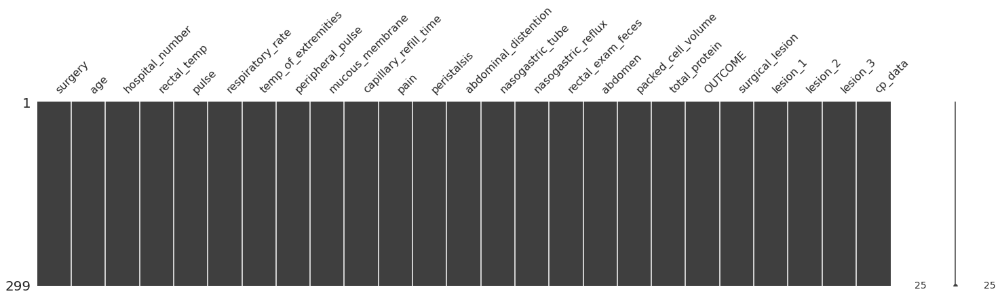

In [69]:
msno.matrix(DATA, figsize=(25,5));

# Análise Exploratória após tratamento dos dados

In [74]:
print(data['hospital_number'].value_counts())

529796    2
528931    2
528890    2
527544    2
528151    2
         ..
527698    1
530255    1
530254    1
533836    1
535043    1
Name: hospital_number, Length: 283, dtype: int64


In [73]:
DATA.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,OUTCOME,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,1.0,1.0,530101.0,38.5,66.0,28.0,2.00000,4.000000,3.980159,3.0,3.000000,1.000000,3.000000,2.153846,2.435233,2.000000,1.000000,45.0,8.4,1.0,1.0,11300.0,0.0,0.0,1.0
1,2.0,1.0,534817.0,39.2,88.0,20.0,2.45679,3.356522,5.000000,2.0,4.000000,1.000000,4.000000,2.153846,2.435233,1.000000,5.000000,50.0,85.0,2.0,1.0,2208.0,0.0,0.0,1.0
2,1.0,1.0,530334.0,38.3,40.0,24.0,3.00000,3.000000,6.000000,2.0,4.000000,3.000000,2.000000,2.153846,2.435233,4.000000,4.000000,33.0,6.7,3.0,1.0,0.0,0.0,0.0,2.0
3,2.0,2.0,5290409.0,39.1,164.0,84.0,1.00000,3.000000,3.000000,3.0,2.000000,1.000000,3.000000,1.000000,1.000000,2.000000,2.265193,48.0,7.2,1.0,2.0,2208.0,0.0,0.0,2.0
4,1.0,1.0,530255.0,37.3,104.0,35.0,2.45679,3.356522,3.000000,3.0,3.032787,2.337255,2.423868,2.153846,2.435233,2.243655,2.265193,74.0,7.4,1.0,1.0,4300.0,0.0,0.0,1.0


In [71]:
DATA.describe()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,OUTCOME,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
count,299.000000,299.000000,2.990000e+02,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000
mean,1.602007,1.080268,1.087733e+06,38.168619,72.000000,30.460581,2.456790,3.356522,3.980159,2.284644,3.032787,2.337255,2.423868,2.153846,2.435233,2.243655,2.265193,46.307407,24.274436,2.337793,1.635452,3659.709030,90.528428,7.387960,1.331104
std,0.490305,0.272162,1.532032e+06,0.655730,27.468469,15.853977,0.764779,0.609668,1.486969,0.442564,1.200863,0.888019,1.035189,0.749462,0.627770,1.017143,1.101053,9.915919,25.804620,0.860940,0.482110,5408.472421,650.637139,127.749768,0.471399
min,1.000000,1.000000,5.184760e+05,35.400000,30.000000,8.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,23.000000,3.300000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,1.000000,1.000000,5.289040e+05,37.900000,48.500000,20.000000,2.000000,3.000000,3.490079,2.000000,2.000000,2.000000,2.000000,2.000000,2.435233,1.000000,1.000000,39.000000,6.600000,1.000000,1.000000,2111.500000,0.000000,0.000000,1.000000
50%,2.000000,1.000000,5.303010e+05,38.168619,68.000000,30.000000,2.456790,3.356522,4.000000,2.000000,3.032787,2.337255,2.423868,2.153846,2.435233,2.243655,2.265193,46.000000,7.700000,3.000000,2.000000,2322.000000,0.000000,0.000000,1.000000
75%,2.000000,1.000000,5.347360e+05,38.500000,88.000000,34.500000,3.000000,4.000000,5.000000,3.000000,4.000000,3.000000,3.000000,3.000000,3.000000,2.243655,2.265193,50.000000,52.000000,3.000000,2.000000,3209.000000,0.000000,0.000000,2.000000
max,2.000000,2.000000,5.305629e+06,40.800000,184.000000,96.000000,4.000000,4.000000,6.000000,3.000000,5.000000,4.000000,4.000000,3.000000,3.000000,4.000000,5.000000,75.000000,89.000000,3.000000,2.000000,41110.000000,7111.000000,2209.000000,2.000000


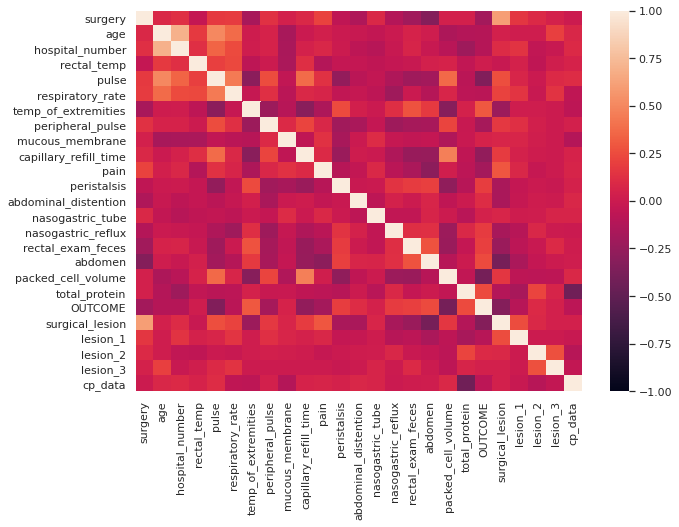

In [75]:
# Análise de correlação

import seaborn as sns

plt.figure(figsize=(10,7))
corr = DATA.corr()
sns.heatmap(corr,vmin=-1,vmax=1, yticklabels=True);
plt.savefig('corr.jpg')

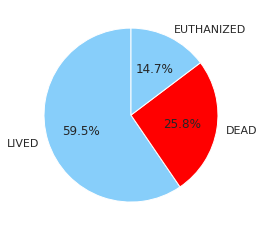

In [77]:
# Verificar a porcentagem de cada variável da saída na base antes da criação do modelo de Aprendizado de Máquina.

df_s = pd.DataFrame(DATA.OUTCOME.value_counts())
df_s

Status = ['LIVED', 'DEAD','EUTHANIZED']

df_s.insert(loc=1,column='status', value=Status)
df_s.head()


labels = df_s.status
colors = ['lightskyblue', 'red']
plt.pie(df_s['OUTCOME'], labels= labels, colors=colors, startangle=90, autopct='%.1f%%')
plt.show()

# Desenvolvimento dos modelos de Aprendizado de Máquina (MACHINE LEARNING).

## Separation of test and train bases.

In [83]:
seed = 1000

from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(DATA.loc[:, DATA.columns != 'OUTCOME'],
                                                    DATA['OUTCOME'], test_size = 0.2,
                                                    random_state = seed)
print('Este é o valor do X_treino', X_train.shape)
print('Este é o valor do X_teste', X_test.shape)
print('Este é o valor do Y_treino', Y_train.shape)
print('Este é o valor do Y_teste', Y_train.shape)

Este é o valor do X_treino (239, 24)
Este é o valor do X_teste (60, 24)
Este é o valor do Y_treino (239,)
Este é o valor do Y_teste (239,)


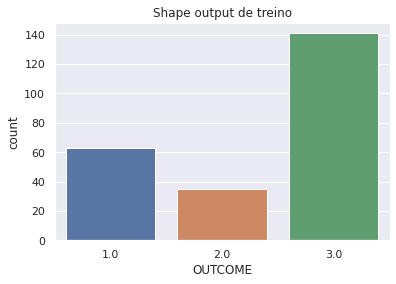

In [84]:
sns.countplot(x=Y_train)
plt.title("Shape output de treino")
plt.show()

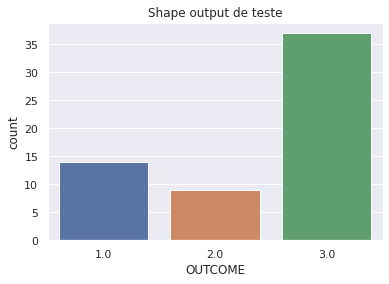

In [85]:
sns.countplot(x=Y_test)
plt.title("Shape output de teste")
plt.show()

## <font color = red> ÁRVORE DE DECISÃO

### First Try (Training Model)

In [86]:
''' Treinando o modelo'''

from sklearn.tree import DecisionTreeClassifier

model = DecisionTreeClassifier(random_state=seed)
model.fit(X_train, Y_train);

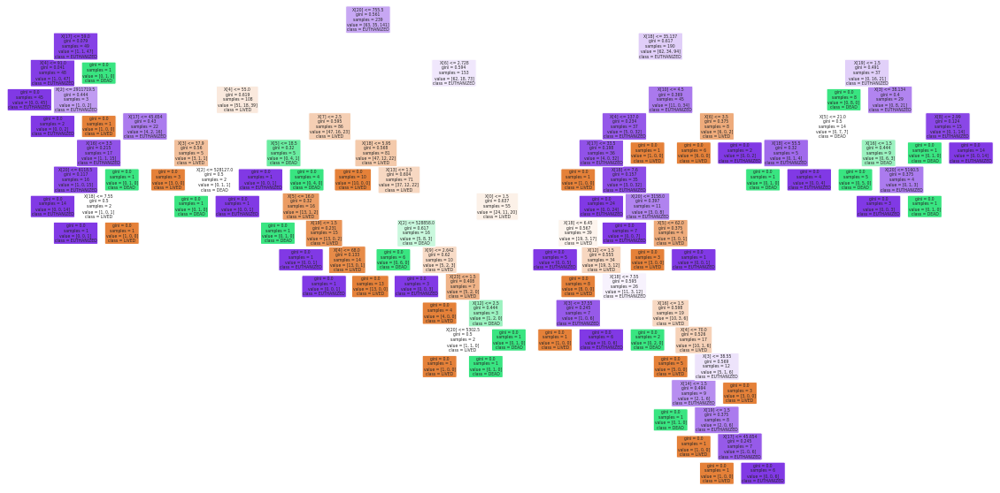

In [87]:
'''Visualizando a árvore de decisão'''

from sklearn import tree

fig, ax = plt.subplots(figsize=(20,10)) # definir tamanho da imagem a ser gerada
tree.plot_tree(model, class_names=['LIVED', 'DEAD','EUTHANIZED'], filled=True, rounded=True); # plota árvore


In [88]:
# Evaluating test Model (ACCURACY)

model.score(X_train, Y_train)

1.0

In [89]:
# Evaluating test Model (ACCURACY)

model.score(X_test, Y_test)

0.7

### Second Try (Normalization)

In [120]:
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(random_state=seed, min_samples_leaf=7)
model.fit(X_train, Y_train);

In [121]:
model.score(X_train, Y_train)

0.8535564853556485

In [122]:
model.score(X_test, Y_test)

0.8166666666666667

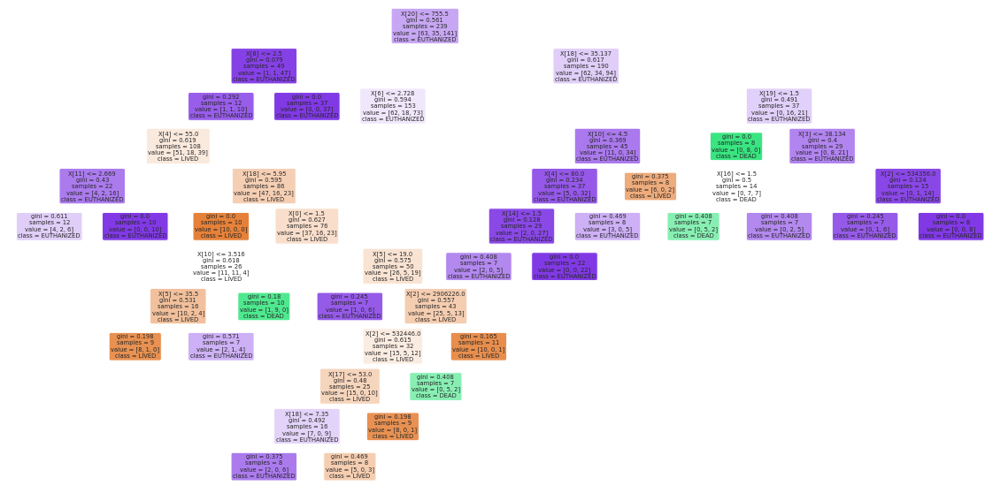

In [123]:
from sklearn import tree

fig, ax = plt.subplots(figsize=(20,10)) # definir tamanho da imagem a ser gerada
tree.plot_tree(model, class_names=['LIVED', 'DEAD','EUTHANIZED'], filled=True, rounded=True); # plota árvore

### Criando a Matrix de confusão do modelo treinado.

Acurácia:  0.8166666666666667
Kappa:  0.6391470749043193
F1:  0.7436919831223628


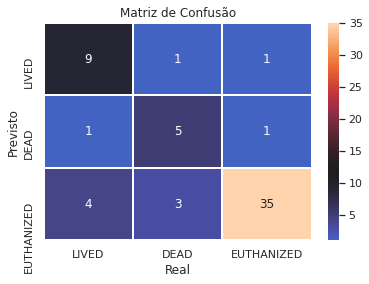

In [124]:
def predict_and_evaluate(X_test, Y_test):

  y_pred = model.predict(X_test) #inferência do teste

  # Acurácia
  from sklearn.metrics import accuracy_score
  accuracy = accuracy_score(Y_test, y_pred)
  print('Acurácia: ', accuracy)

  # Kappa
  from sklearn.metrics import cohen_kappa_score
  kappa = cohen_kappa_score(Y_test, y_pred)
  print('Kappa: ', kappa)

  # F1
  from sklearn.metrics import f1_score
  f1 = f1_score(Y_test, y_pred, average='macro')
  print('F1: ', f1)

  # Matriz de confusão
  from sklearn.metrics import confusion_matrix
  confMatrix = confusion_matrix(y_pred, Y_test)
    
  ax = plt.subplot()
  sns.heatmap(confMatrix, annot=True, fmt=".0f", center=12, linewidths=1)
  plt.xlabel('Real')
  plt.ylabel('Previsto')
  plt.title('Matriz de Confusão')

  ax.xaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED']) 
  ax.yaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED'])
  plt.show()
    
predict_and_evaluate(X_test, Y_test)

### <font color = red> GRID SEARCH

In [125]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Set the parameters by cross-validation

tuned_parameters = [{'criterion': ['gini', 'entropy'], 'max_depth': [1,2,4,8,10], 'min_samples_leaf': [1,2,3,4,5,8,10]}]

print("# Tuning hyper-parameters for F1 score")
print()

model_G = GridSearchCV(DecisionTreeClassifier(), tuned_parameters, scoring='f1_macro')
model.fit(X_train, Y_train)

y_true, y_pred = Y_test, model.predict(X_test)

print(classification_report(y_true, y_pred))
print()

# Tuning hyper-parameters for F1 score

              precision    recall  f1-score   support

         1.0       0.82      0.64      0.72        14
         2.0       0.71      0.56      0.63         9
         3.0       0.83      0.95      0.89        37

    accuracy                           0.82        60
   macro avg       0.79      0.71      0.74        60
weighted avg       0.81      0.82      0.81        60




Acurácia:  0.8166666666666667
Kappa:  0.6391470749043193
F1:  0.7436919831223628


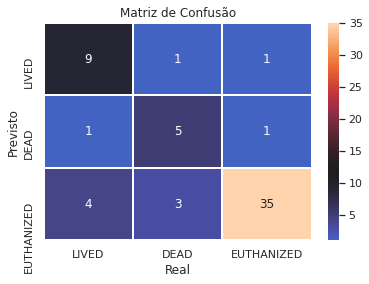

In [126]:
''' Para usar esse códico, é necessário criar a função que gera a matrix de confusão que está no notebook credito AD.'''

predict_and_evaluate(X_test, Y_test)

### Salvando o modelo (PRONTO PARA UTILIZAÇÃO)

In [127]:
''' O modelo a ser salvo para colocar em produção, será o que não passou pelo
processo do GridSearch, já que o mesmo apresentou acurácia menor.''' 

import pickle
pickle.dump(model, open('model_DT.sav', 'wb'))

## <font color = red> RANDOM FOREST

In [211]:
# treinar modelo

from sklearn.ensemble import RandomForestClassifier

def train(X_train, Y_train, seed):
  model_1 = RandomForestClassifier(min_samples_leaf=9, random_state=seed) # tente mudar parâmetro para evitar overfitting
  model.fit(X_train, Y_train);
  return model

model_1 = train(X_train, Y_train, seed)

[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  18 out of  20 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=12)]: Done  20 out of  20 | elapsed:    0.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  18 out of  20 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=12)]: Done  20 out of  20 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  18 out of  20 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=12)]: Done  20 out of  20 | elapsed:    0.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  18 out of  20 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=12)]: Done  20 out of  20 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent worker

### Avaliar modelo treinado na base de teste

[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  18 out of  20 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=12)]: Done  20 out of  20 | elapsed:    0.0s finished


Acurácia:  0.75
Kappa:  0.48805460750853247
F1:  0.6153332264443375


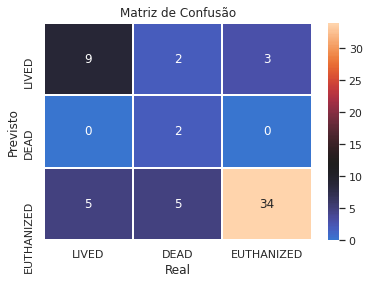

In [212]:
def predict_and_evaluate_1(X_test, Y_test):

  y_pred = model_1.predict(X_test) #inferência do teste

  # Acurácia
  from sklearn.metrics import accuracy_score
  accuracy = accuracy_score(Y_test, y_pred)
  print('Acurácia: ', accuracy)

  # Kappa
  from sklearn.metrics import cohen_kappa_score
  kappa = cohen_kappa_score(Y_test, y_pred)
  print('Kappa: ', kappa)

  # F1
  from sklearn.metrics import f1_score
  f1 = f1_score(Y_test, y_pred, average='macro')
  print('F1: ', f1)

  # Matriz de confusão
  from sklearn.metrics import confusion_matrix
  confMatrix = confusion_matrix(y_pred, Y_test)
    
  ax = plt.subplot()
  sns.heatmap(confMatrix, annot=True, fmt=".0f", center=12, linewidths=1)
  plt.xlabel('Real')
  plt.ylabel('Previsto')
  plt.title('Matriz de Confusão')

  ax.xaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED']) 
  ax.yaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED'])
  plt.show()
    
predict_and_evaluate_1(X_test, Y_test)

### Normalizar

In [213]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [214]:
# Treinar e Testar novamente

model_2 = train(X_train, Y_train, seed)
# predict_and_evaluate(X_test, Y_test)

[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  18 out of  20 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=12)]: Done  20 out of  20 | elapsed:    0.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  18 out of  20 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=12)]: Done  20 out of  20 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  18 out of  20 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=12)]: Done  20 out of  20 | elapsed:    0.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  18 out of  20 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=12)]: Done  20 out of  20 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent worker

[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  18 out of  20 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=12)]: Done  20 out of  20 | elapsed:    0.0s finished


Acurácia:  0.75
Kappa:  0.503858875413451
F1:  0.646612880790096


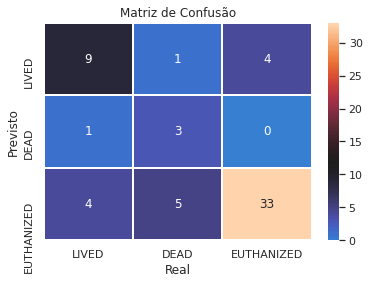

In [216]:
def predict_and_evaluate_2(X_test, Y_test):

  y_pred = model_2.predict(X_test) #inferência do teste

  # Acurácia
  from sklearn.metrics import accuracy_score
  accuracy = accuracy_score(Y_test, y_pred)
  print('Acurácia: ', accuracy)

  # Kappa
  from sklearn.metrics import cohen_kappa_score
  kappa = cohen_kappa_score(Y_test, y_pred)
  print('Kappa: ', kappa)

  # F1
  from sklearn.metrics import f1_score
  f1 = f1_score(Y_test, y_pred, average='macro')
  print('F1: ', f1)

  # Matriz de confusão
  from sklearn.metrics import confusion_matrix
  confMatrix = confusion_matrix(y_pred, Y_test)
    
  ax = plt.subplot()
  sns.heatmap(confMatrix, annot=True, fmt=".0f", center=12, linewidths=1)
  plt.xlabel('Real')
  plt.ylabel('Previsto')
  plt.title('Matriz de Confusão')

  ax.xaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED']) 
  ax.yaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED'])
  plt.show()
    
predict_and_evaluate_2(X_test, Y_test)

In [217]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Ajustar os parâmetros para avaliação cruzada.

tuned_parameters = [{'n_estimators': [20, 50, 100, 150, 200],
                     'max_features': [3,4,8,10]}]

print("# Tuning hyper-parameters for F1 score")
print()

model = GridSearchCV(RandomForestClassifier(n_jobs=12, verbose=1), tuned_parameters, scoring='f1_macro')
model.fit(X_train, Y_train)

Y_true, Y_pred = Y_test, model.predict(X_test)
print(classification_report(Y_true, Y_pred))
print()

# Tuning hyper-parameters for F1 score



[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  18 out of  20 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=12)]: Done  20 out of  20 | elapsed:    0.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  18 out of  20 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=12)]: Done  20 out of  20 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  18 out of  20 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=12)]: Done  20 out of  20 | elapsed:    0.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  18 out of  20 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=12)]: Done  20 out of  20 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent worker

              precision    recall  f1-score   support

         1.0       0.71      0.71      0.71        14
         2.0       1.00      0.33      0.50         9
         3.0       0.79      0.92      0.85        37

    accuracy                           0.78        60
   macro avg       0.83      0.66      0.69        60
weighted avg       0.80      0.78      0.77        60




[Parallel(n_jobs=12)]: Done  50 out of  50 | elapsed:    0.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done  50 out of  50 | elapsed:    0.0s finished


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done  50 out of  50 | elapsed:    0.0s finished


Acurácia:  0.7833333333333333
Kappa:  0.5632698768197089
F1:  0.6880952380952382


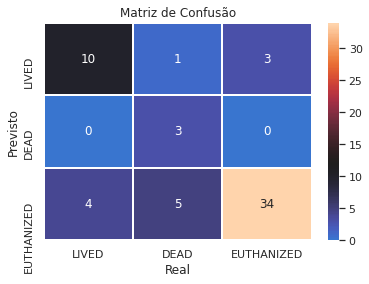

In [218]:
def predict_and_evaluate(X_test, Y_test):

  y_pred = model.predict(X_test) #inferência do teste

  # Acurácia
  from sklearn.metrics import accuracy_score
  accuracy = accuracy_score(Y_test, y_pred)
  print('Acurácia: ', accuracy)

  # Kappa
  from sklearn.metrics import cohen_kappa_score
  kappa = cohen_kappa_score(Y_test, y_pred)
  print('Kappa: ', kappa)

  # F1
  from sklearn.metrics import f1_score
  f1 = f1_score(Y_test, y_pred, average='macro')
  print('F1: ', f1)

  # Matriz de confusão
  from sklearn.metrics import confusion_matrix
  confMatrix = confusion_matrix(y_pred, Y_test)
    
  ax = plt.subplot()
  sns.heatmap(confMatrix, annot=True, fmt=".0f", center=12, linewidths=1)
  plt.xlabel('Real')
  plt.ylabel('Previsto')
  plt.title('Matriz de Confusão')

  ax.xaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED']) 
  ax.yaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED'])
  plt.show()
    
predict_and_evaluate(X_test, Y_test)

### Saving model READY TO USE

In [219]:
'''Como a melhor aurácia observado foi após o GridSearch, esse modelo será salvo para produção.'''

import pickle
pickle.dump(model, open('model_RF.sav', 'wb'))

## <font color = red> KNN

In [286]:
# treinar modelo

from sklearn.neighbors import KNeighborsClassifier

def train(X_train, Y_train, n_neighbors=3):
  model = KNeighborsClassifier(n_neighbors=n_neighbors)
  model.fit(X_train, Y_train);
  y_pred = model.predict(X_test) #inferência do teste

  return model, y_pred

model, y_pred = train(X_train, Y_train)

Acurácia:  0.7
Kappa:  0.4545454545454546
F1:  0.5794428882664177


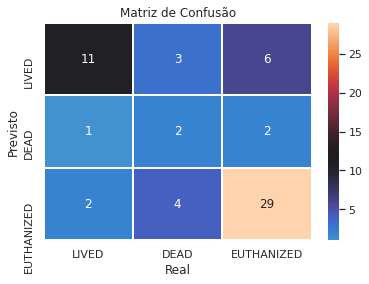

In [287]:
def predict_and_evaluate(X_test, Y_test):

  y_pred = model.predict(X_test) #inferência do teste

  # Acurácia
  from sklearn.metrics import accuracy_score
  accuracy = accuracy_score(Y_test, y_pred)
  print('Acurácia: ', accuracy)

  # Kappa
  from sklearn.metrics import cohen_kappa_score
  kappa = cohen_kappa_score(Y_test, y_pred)
  print('Kappa: ', kappa)

  # F1
  from sklearn.metrics import f1_score
  f1 = f1_score(Y_test, y_pred, average='macro')
  print('F1: ', f1)

  # Matriz de confusão
  from sklearn.metrics import confusion_matrix
  confMatrix = confusion_matrix(y_pred, Y_test)
    
  ax = plt.subplot()
  sns.heatmap(confMatrix, annot=True, fmt=".0f", center=12, linewidths=1)
  plt.xlabel('Real')
  plt.ylabel('Previsto')
  plt.title('Matriz de Confusão')

  ax.xaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED']) 
  ax.yaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED'])
  plt.show()
    
predict_and_evaluate(X_test, Y_test)

### Normalizar

In [288]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [289]:
# Treinar e Testar novamente

model = train(X_train, Y_train)
# predict_and_evaluate(X_test, Y_test)

In [290]:
def predict_and_evaluate(X_test, Y_test):

  y_pred = model.predict(X_test) #inferência do teste

  # Acurácia
  from sklearn.metrics import accuracy_score
  accuracy = accuracy_score(Y_test, y_pred)
  print('Acurácia: ', accuracy)

  # Kappa
  from sklearn.metrics import cohen_kappa_score
  kappa = cohen_kappa_score(Y_test, y_pred)
  print('Kappa: ', kappa)

  # F1
  from sklearn.metrics import f1_score
  f1 = f1_score(Y_test, y_pred, average='macro')
  print('F1: ', f1)

  # Matriz de confusão
  from sklearn.metrics import confusion_matrix
  confMatrix = confusion_matrix(y_pred, Y_test)
    
  ax = plt.subplot()
  sns.heatmap(confMatrix, annot=True, fmt=".0f", center=12, linewidths=1)
  plt.xlabel('Real')
  plt.ylabel('Previsto')
  plt.title('Matriz de Confusão')

  ax.xaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED']) 
  ax.yaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED'])
  plt.show()
    
predict_and_evaluate(X_test, Y_test)

AttributeError: ignored

### GridSearch

In [272]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Parâmetros a serem testados
tuned_parameters = [{'n_neighbors': [4, 6, 7, 8, 10,16]
                     }]

print("# Tuning hyper-parâmetros parar F1 score")
print()

model = GridSearchCV(KNeighborsClassifier(), tuned_parameters, scoring='f1_macro')
model.fit(X_train, Y_train)

y_pred3 = model.predict(X_test)
print(classification_report(Y_test, Y_pred))
print()

# Tuning hyper-parâmetros parar F1 score

              precision    recall  f1-score   support

         1.0       0.71      0.71      0.71        14
         2.0       1.00      0.33      0.50         9
         3.0       0.79      0.92      0.85        37

    accuracy                           0.78        60
   macro avg       0.83      0.66      0.69        60
weighted avg       0.80      0.78      0.77        60




Acurácia:  0.6666666666666666
Kappa:  0.3883792048929664
F1:  0.576541095890411


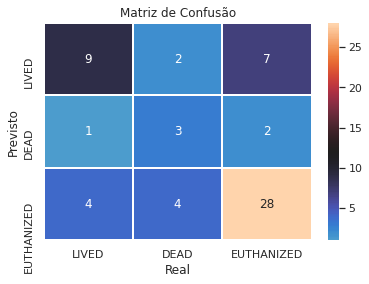

In [273]:
def predict_and_evaluate_3(X_test, Y_test):

  y_pred3 = model.predict(X_test) #inferência do teste

  # Acurácia
  from sklearn.metrics import accuracy_score
  accuracy = accuracy_score(Y_test, y_pred3)
  print('Acurácia: ', accuracy)

  # Kappa
  from sklearn.metrics import cohen_kappa_score
  kappa = cohen_kappa_score(Y_test, y_pred3)
  print('Kappa: ', kappa)

  # F1
  from sklearn.metrics import f1_score
  f1 = f1_score(Y_test, y_pred3, average='macro')
  print('F1: ', f1)

  # Matriz de confusão
  from sklearn.metrics import confusion_matrix
  confMatrix = confusion_matrix(y_pred3, Y_test)
    
  ax = plt.subplot()
  sns.heatmap(confMatrix, annot=True, fmt=".0f", center=12, linewidths=1)
  plt.xlabel('Real')
  plt.ylabel('Previsto')
  plt.title('Matriz de Confusão')

  ax.xaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED']) 
  ax.yaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED'])
  plt.show()
    
predict_and_evaluate_3(X_test, Y_test)

Acurácia:  0.6333333333333333
Kappa:  0.21381774865991665
F1:  0.4021164021164021


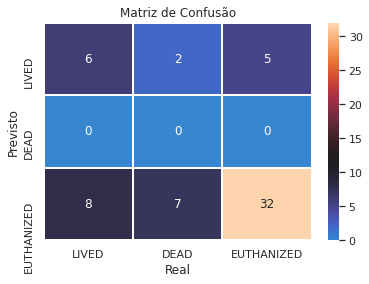

In [230]:
predict_and_evaluate(X_test, Y_test)

### Saving model READY TO USE

In [ ]:
import pickle
pickle.dump(model, open('model_KNN.sav', 'wb'))

## <font color = red> SVM

### Treinando o modelo SVM

In [292]:
# treinar modelo

from sklearn.svm import SVC

def trainSVM(X_train, Y_train, seed):
  model = SVC(random_state=seed)
  model.fit(X_train, Y_train)
  return model

model = trainSVM(X_train, Y_train, seed)

In [ ]:
# remover as mesmas colunas removidas por variância zero. Nesse caso não houveram tais atributos. 
# Deixo o código caso tenham um caso que ocorra. Aqui não fará nenhuma diferença.

X_test = zero_var_filter.transform(X_test)
X_test.shape

Acurácia:  0.6833333333333333
Kappa:  0.32504440497335696
F1:  0.49044733044733047


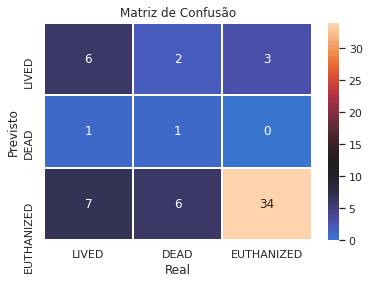

In [294]:
def predict_and_evaluate(X_test, Y_test):

  y_pred = model.predict(X_test) #inferência do teste

  # Acurácia
  from sklearn.metrics import accuracy_score
  accuracy = accuracy_score(Y_test, y_pred)
  print('Acurácia: ', accuracy)

  # Kappa
  from sklearn.metrics import cohen_kappa_score
  kappa = cohen_kappa_score(Y_test, y_pred)
  print('Kappa: ', kappa)

  # F1
  from sklearn.metrics import f1_score
  f1 = f1_score(Y_test, y_pred, average='macro')
  print('F1: ', f1)

  # Matriz de confusão
  from sklearn.metrics import confusion_matrix
  confMatrix = confusion_matrix(y_pred, Y_test)
    
  ax = plt.subplot()
  sns.heatmap(confMatrix, annot=True, fmt=".0f", center=12, linewidths=1)
  plt.xlabel('Real')
  plt.ylabel('Previsto')
  plt.title('Matriz de Confusão')

  ax.xaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED']) 
  ax.yaxis.set_ticklabels(['LIVED', 'DEAD','EUTHANIZED'])
  plt.show()
    
predict_and_evaluate(X_test, Y_test)

### Normalizar

In [296]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

Acurácia:  0.6833333333333333
Kappa:  0.32504440497335696
F1:  0.49044733044733047


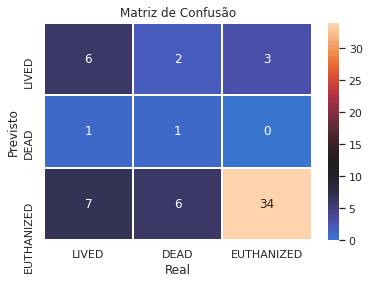

In [297]:
# Treinar e Testar novamente

model = trainSVM(X_train, Y_train, seed)
predict_and_evaluate(X_test, Y_test)

### GridSearch

In [299]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Set the parameters by cross-validation
tuned_parameters = [{'kernel': ['rbf'], 'gamma': [1e-3, 1e-5],
                     'C': [100,1000]}]
                     
print("# Tuning hyper-parameters for F1 score")
print()

model = GridSearchCV(SVC(), tuned_parameters, scoring='f1_macro')
model.fit(X_train, Y_train)

Y_true, Y_pred = Y_test, model.predict(X_test)
print(classification_report(Y_true, Y_pred))
print()

# Tuning hyper-parameters for F1 score

              precision    recall  f1-score   support

         1.0       0.53      0.57      0.55        14
         2.0       0.27      0.33      0.30         9
         3.0       0.82      0.76      0.79        37

    accuracy                           0.65        60
   macro avg       0.54      0.55      0.55        60
weighted avg       0.67      0.65      0.66        60




Acurácia:  0.65
Kappa:  0.38022626660108216
F1:  0.5468188440990772


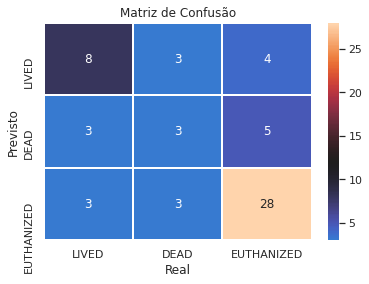

In [300]:
predict_and_evaluate(X_test, Y_test)

### Saving model READY TO USE

In [ ]:
import pickle
pickle.dump(model, open('model_SVM.sav', 'wb'))